## Different types of visualiations 

In [2]:
! pip install kagglehub

In [29]:
pip install geodatasets


   ---------------------------------------- 0/2 [pooch]
   -------------------- ------------------- 1/2 [geodatasets]
   ---------------------------------------- 2/2 [geodatasets]

Note: you may need to restart the kernel to use updated packages.


In [ ]:
import kagglehub
import pandas as pd
import os

# Download latest version
path = kagglehub.dataset_download("deltaromeo/uk-national-lottery-results-1994-2023")
print("Path to dataset files:", path)

# Check what files are inside
print("Files in dataset:", os.listdir(path))

# Assuming it’s a CSV file (common on Kaggle)
#csv_path = os.path.join(path, "UK National Lottery Results 1994-2023.csv")  # adjust filename if different
#df = pd.read_csv(csv_path)

#print(df.head())   # show first rows
#print(df.info())   # dataset summary

In [6]:
import os

print("Files in dataset folder:")
print(os.listdir(path))


Files in dataset folder:
['drawn.csv', 'lohi.csv', 'lottery.db']


In [7]:
import pandas as pd
import os

df_draws = pd.read_csv(os.path.join(path, "drawn.csv"))
print(df_draws.head())
print(df_draws.info())


    No.   Day  DD  MMM  YYYY  N1  N2  N3  N4  N5  N6  BN  Jackpot  Wins  \
0  3095   Wed  20  Aug  2025   1   9  10  32  44  55  49  5208913     0   
1  3094   Sat  16  Aug  2025   1  11  15  19  45  48  37  3899678     0   
2  3093   Wed  13  Aug  2025   1  16  27  41  50  55  54  2000000     0   
3  3092   Sat   9  Aug  2025   2  27  29  38  44  51  23  7394521     1   
4  3091   Wed   6  Aug  2025   5   9  17  31  47  58  35  5302085     0   

        Machine   Set  
0    Lancelot      3   
1     Lotto 2      2   
2     Lotto 2      2   
3     Lotto 2      3   
4     Lotto 2      3   
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3095 entries, 0 to 3094
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   No.      3095 non-null   int64 
 1    Day     3095 non-null   object
 2   DD       3095 non-null   int64 
 3   MMM      3095 non-null   object
 4   YYYY     3095 non-null   int64 
 5   N1       3095 non-null   int64 
 6

## Ydata_profiling

In [8]:
from ydata_profiling import ProfileReport

# Generate the profile
profile = ProfileReport(df_draws, title="UK National Lottery Profiling Report", explorative=True)

# Option 1: open in notebook
profile.to_notebook_iframe()

# Option 2: save as HTML report
profile.to_file("lottery_profiling_report.html")


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 2655.57it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## See the number distribution 

In [10]:
df_draws.columns = df_draws.columns.str.strip()


In [11]:
import pandas as pd

# reshape into long format
df_numbers = df_draws.melt(
    id_vars=["No.", "Day", "DD", "MMM", "YYYY", "Jackpot", "Wins", "Machine", "Set"],
    value_vars=["N1","N2","N3","N4","N5","N6","BN"],
    var_name="BallPosition",
    value_name="BallNumber"
)

# frequency count
freq = df_numbers["BallNumber"].value_counts().sort_index().reset_index()
freq.columns = ["BallNumber", "Frequency"]


## Matlplotlib 

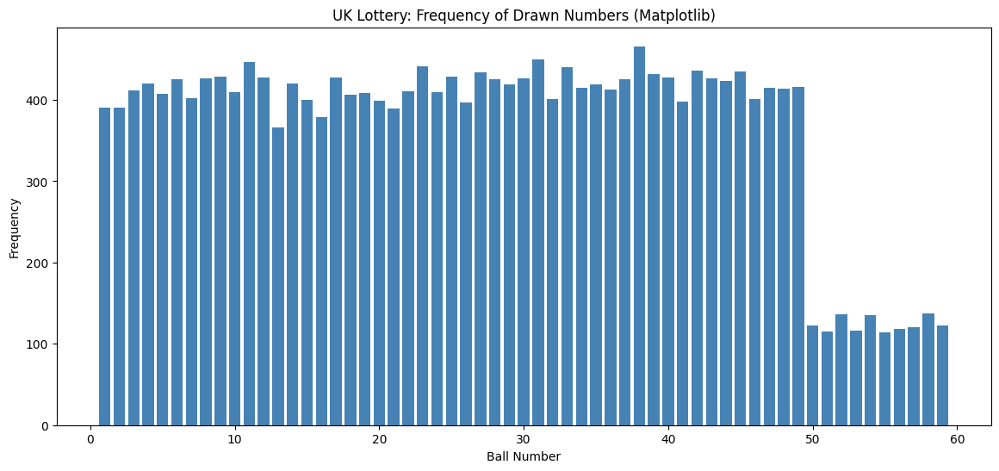

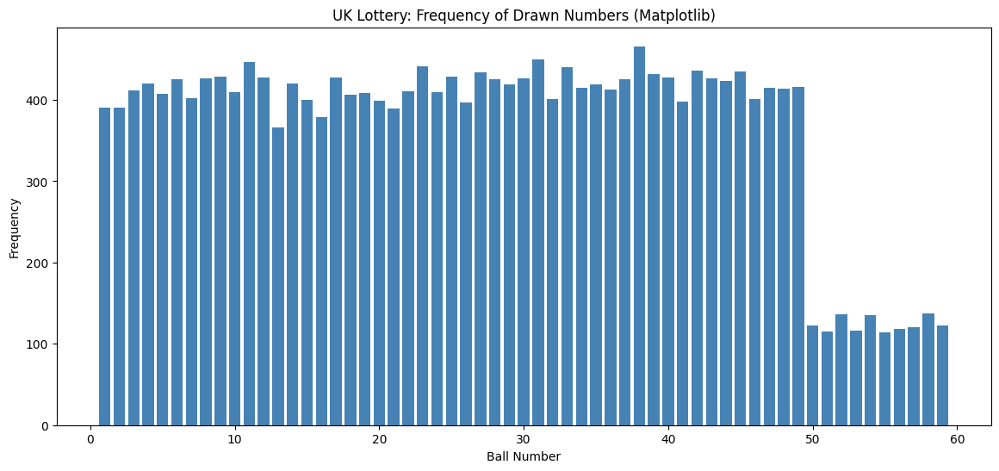

In [13]:
%matplotlib inline

import matplotlib.pyplot as plt

plt.figure(figsize=(14,6))
plt.bar(freq["BallNumber"], freq["Frequency"], color="steelblue")
plt.title("UK Lottery: Frequency of Drawn Numbers (Matplotlib)")
plt.xlabel("Ball Number")
plt.ylabel("Frequency")
plt.show()

In [14]:
top5 = freq.sort_values("Frequency", ascending=False).head()
print(top5)


    BallNumber  Frequency
37          38        466
30          31        450
10          11        447
22          23        441
32          33        440


## Seaborn 

C:\Users\crist\AppData\Local\Temp\ipykernel_28140\989113894.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="BallNumber", y="Frequency", data=freq, palette="viridis")


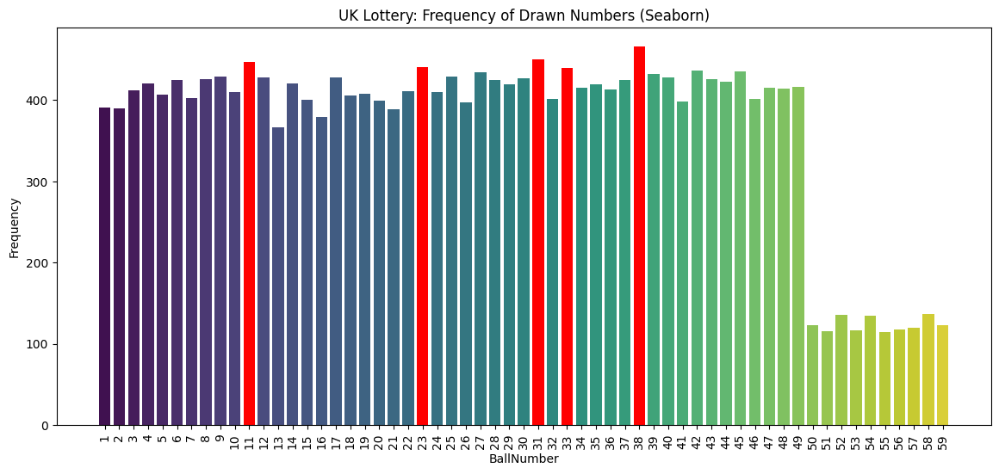

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(14,6))
sns.barplot(x="BallNumber", y="Frequency", data=freq, palette="viridis")
plt.title("UK Lottery: Frequency of Drawn Numbers (Seaborn)")
plt.xticks(rotation=90)

# Highlight top5 in red
for ball in top5["BallNumber"]:
    plt.bar(ball-1, freq.loc[freq["BallNumber"]==ball,"Frequency"], color="red")
plt.show()

In [16]:
bottom5 = freq.sort_values("Frequency", ascending=True).head()
print(bottom5)

    BallNumber  Frequency
54          55        114
50          51        115
52          53        116
55          56        118
56          57        120


C:\Users\crist\AppData\Local\Temp\ipykernel_28140\3740096476.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="BallNumber", y="Frequency", data=freq, palette="viridis")


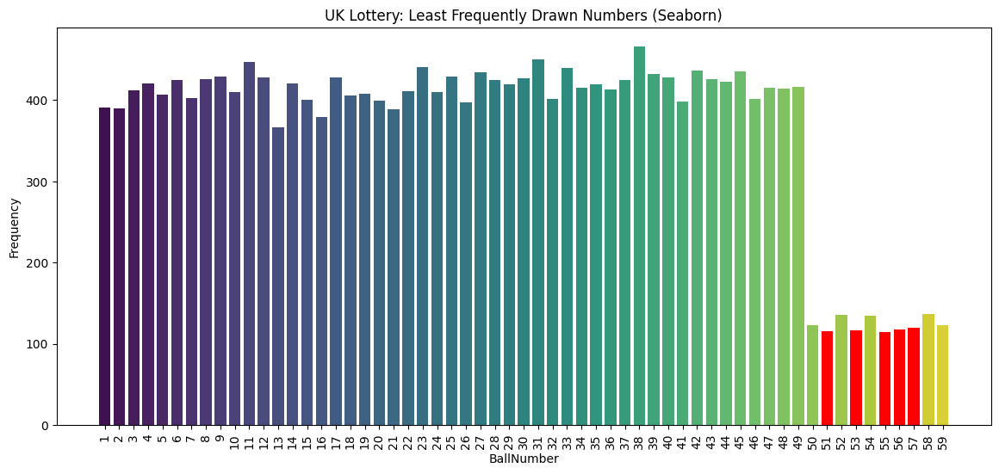

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(14,6))
sns.barplot(x="BallNumber", y="Frequency", data=freq, palette="viridis")
plt.title("UK Lottery: Least Frequently Drawn Numbers (Seaborn)")
plt.xticks(rotation=90)

# highlight bottom 5 in red
for ball in bottom5["BallNumber"]:
    plt.bar(ball-1, freq.loc[freq["BallNumber"]==ball, "Frequency"], color="red")
plt.show()

## Plotly

In [20]:
!pip install plotly

  Using cached plotly-6.3.0-py3-none-any.whl.metadata (8.5 kB)
Using cached plotly-6.3.0-py3-none-any.whl (9.8 MB)


  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


#### Normalize 

In [21]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go

# --- 0) Tidy columns & build a proper date ---
df = df_draws.copy()
df.columns = df.columns.str.strip()  # remove leading/trailing spaces in names
# Build datetime from DD MMM YYYY (e.g. "20 Aug 2025")
df["date"] = pd.to_datetime(df["DD"].astype(str) + " " + df["MMM"] + " " + df["YYYY"].astype(str), dayfirst=True)

# --- 1) Reshape to long so all balls live in one column ---
value_cols = ["N1","N2","N3","N4","N5","N6","BN"]
long = df.melt(
    id_vars=["No.","Day","DD","MMM","YYYY","date","Jackpot","Wins","Machine","Set"],
    value_vars=value_cols,
    var_name="BallPosition",
    value_name="BallNumber"
)

# --- 2) Observed frequency per ball ---
obs = (long["BallNumber"]
       .value_counts()
       .sort_index()
       .rename_axis("BallNumber")
       .reset_index(name="Observed"))

# Ensure we include *every* ball 1..59 (in case some never appeared)
all_balls = pd.DataFrame({"BallNumber": np.arange(1, 60)})
obs = all_balls.merge(obs, on="BallNumber", how="left").fillna({"Observed": 0}).astype({"Observed": int})

# --- 3) Work out era sizes (pre/post expansion) ---
# UK Lotto expansion to 59 balls took effect 2015-10-10
expansion_date = pd.Timestamp("2015-10-10")
pre_mask  = df["date"] < expansion_date
post_mask = df["date"] >= expansion_date

draws_pre  = pre_mask.sum()
draws_post = post_mask.sum()
draws_total = len(df)

# Each draw contributes 7 numbers in your data (6 main + bonus)
balls_pre  = 49
balls_post = 59
numbers_per_draw = 7

# Expected count for each ball i:
# - If i in 1..49: it was alive in both eras → E = draws_pre*(7/49) + draws_post*(7/59)
# - If i in 50..59: only alive post-expansion → E = draws_post*(7/59)
def expected_count(ball):
    if ball <= 49:
        return draws_pre * (numbers_per_draw / balls_pre) + draws_post * (numbers_per_draw / balls_post)
    else:
        return draws_post * (numbers_per_draw / balls_post)

obs["Expected"] = obs["BallNumber"].apply(expected_count)

# --- 4) Normalized metric (Observed vs fair expectation) ---
obs["Ratio_Observed_to_Expected"] = obs["Observed"] / obs["Expected"]

# --- 5) Plotly: Observed vs Expected (interactive bar + expected line) ---
fig1 = go.Figure()
fig1.add_bar(x=obs["BallNumber"], y=obs["Observed"], name="Observed")
fig1.add_scatter(x=obs["BallNumber"], y=obs["Expected"], mode="lines", name="Expected (adjusted)")
fig1.update_layout(
    title="UK Lotto: Observed vs Expected Counts (Adjusted for 2015 expansion)",
    xaxis_title="Ball Number",
    yaxis_title="Count",
    hovermode="x unified"
)
fig1.show()

# --- 6) Plotly: Normalized ratio (Observed / Expected) ---
fig2 = px.bar(
    obs,
    x="BallNumber",
    y="Ratio_Observed_to_Expected",
    title="UK Lotto: Normalized Frequency (Observed / Expected)",
    labels={"BallNumber":"Ball Number", "Ratio_Observed_to_Expected":"Observed / Expected"},
    color="Ratio_Observed_to_Expected",
    color_continuous_scale="Viridis"
)
# Add a reference line at 1.0 (perfectly as expected)
fig2.add_hline(y=1.0, line_dash="dot", line_color="gray")
fig2.update_layout(hovermode="x unified")
fig2.show()

# --- 7) (Optional) Show top/bottom after normalization ---
top5   = obs.sort_values("Ratio_Observed_to_Expected", ascending=False).head(5)
bottom5= obs.sort_values("Ratio_Observed_to_Expected", ascending=True).head(5)
display(top5[["BallNumber","Observed","Expected","Ratio_Observed_to_Expected"]])
display(bottom5[["BallNumber","Observed","Expected","Ratio_Observed_to_Expected"]])


,BallNumber,Observed,Expected,Ratio_Observed_to_Expected
57,58,137,122.20339,1.121082
37,38,466,417.20339,1.116961
51,52,136,122.20339,1.112899
53,54,135,122.20339,1.104716
30,31,450,417.20339,1.078611


,BallNumber,Observed,Expected,Ratio_Observed_to_Expected
12,13,366,417.20339,0.877270
15,16,379,417.20339,0.908430
20,21,389,417.20339,0.932399
54,55,114,122.20339,0.932871
1,2,390,417.20339,0.934796


## Pop out the visuals

In [22]:
fig1.show(renderer="browser")
fig2.show(renderer="browser")

## Different datasets 

In [24]:
import kagglehub, os

path = kagglehub.dataset_download("kalilurrahman/python-data-visualization-essentials-guide")
print("Dataset files:", os.listdir(path))

100%|█████████████████████████████████████████████████████████████████████████████| 2.26M/2.26M [00:00<00:00, 4.07MB/s]

Extracting files...


Dataset files: ['1976-2020-president.csv', '19762016USPrez.csv', '2015.csv', '2016.csv', '2017.csv', '2018.csv', '2019.csv', 'AAPL.csv', 'bad-drivers.csv', 'car_crashes.csv', 'flights.csv', 'LIQuizPollData - Sheet1 (2).csv', 'Nasdaq_BT_summary.csv', 'OECD_HEALTH_STAT_CANCER_STATISTICS.csv', 'Summer-Olympic-medals-1976-to-2008.csv', 'Titanic.csv', 'travel-times.csv', 'UN_MigrantStockTotal_2019.xlsx', 'us-states.json', 'worldcities.csv', 'WorldPopulation.csv']


In [25]:
df = kagglehub.dataset_load(
    KaggleDatasetAdapter.PANDAS,
    "kalilurrahman/python-data-visualization-essentials-guide",
    "WorldPopulation.csv"
)
print(df.head())


Download already complete (11634 bytes).
                 region;"subregion";"key";"value"
0     Asia;"Southern Asia";"Afghanistan";25500100
1  Europe;"Northern Europe";"Åland Islands";28502
2      Europe;"Southern Europe";"Albania";2821977
3     Africa;"Northern Africa";"Algeria";37900000
4      Oceania;"Polynesia";"American Samoa";55519


## Folium

In [27]:
import pandas as pd

file_path = os.path.join(path, "WorldPopulation.csv")

df = pd.read_csv(
    file_path,
    sep=";",
    header=None,
    names=["Continent","Region","Country","Population"],
    quotechar='"',
    encoding="utf-8"
)

print(df.head())


  Continent           Region        Country Population
0    region        subregion            key      value
1      Asia    Southern Asia    Afghanistan   25500100
2    Europe  Northern Europe  Åland Islands      28502
3    Europe  Southern Europe        Albania    2821977
4    Africa  Northern Africa        Algeria   37900000


In [34]:
# Which column does your Natural Earth layer use? (usually NAME_EN)
left_key = "NAME_EN" if "NAME_EN" in world.columns else "NAME"

# Countries in your CSV that didn't join to a polygon:
missing = df[~df["Country_fixed"].isin(world[left_key])]
missing.sort_values("Country").head(20)


,Continent,Region,Country,Population,Country_fixed
5,Oceania,Polynesia,American Samoa,5.551900e+04,American Samoa
6,Europe,Southern Europe,Andorra,7.624600e+04,Andorra
8,Americas,Caribbean,Anguilla,1.345200e+04,Anguilla
10,Americas,Caribbean,Antigua and Barbuda,8.629500e+04,Antigua and Barbuda
13,Americas,Caribbean,Aruba,1.014840e+05,Aruba
17,Americas,Caribbean,Bahamas,-1.000000e+00,Bahamas
18,Asia,Western Asia,Bahrain,1.234571e+06,Bahrain
20,Americas,Caribbean,Barbados,2.742000e+05,Barbados
25,Americas,Northern America,Bermuda,6.423700e+04,Bermuda
28,Americas,Caribbean,Bonaire,-1.000000e+00,Bonaire


In [33]:
import os
import pandas as pd
import geopandas as gpd
import folium

# --- Load your CSV from the KaggleHub path ---
# If you already have `path` from kagglehub.dataset_download(...), reuse it.
# Otherwise, set it explicitly.
# import kagglehub
# path = kagglehub.dataset_download("kalilurrahman/python-data-visualization-essentials-guide")

file_path = os.path.join(path, "WorldPopulation.csv")
df = pd.read_csv(
    file_path,
    sep=";",
    header=None,
    names=["Continent","Region","Country","Population"],
    quotechar='"',
    encoding="utf-8"
)
df["Country"] = df["Country"].str.strip().str.replace('"','', regex=False)
df["Population"] = pd.to_numeric(df["Population"], errors="coerce")

# --- Read Natural Earth "admin 0 countries" directly from URL (zipped shapefile) ---
ne_countries_zip = "zip+https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip"
world = gpd.read_file(ne_countries_zip)  # columns: NAME_EN, NAME_LONG, ADM0_A3, geometry, etc.

# --- Light name harmonisation (expand as needed) ---
name_fix = {
    "United States": "United States of America",
    "Congo (Brazzaville)": "Republic of the Congo",
    "Congo (Kinshasa)": "Democratic Republic of the Congo",
    "Côte d’Ivoire": "Côte d'Ivoire",
    "South Korea": "Republic of Korea",
    "North Korea": "Dem. Rep. Korea",
    "Russia": "Russian Federation",
    "Vietnam": "Viet Nam",
    "Syria": "Syrian Arab Republic",
    "Laos": "Lao PDR",
    "Cape Verde": "Cabo Verde",
    "Eswatini": "Swaziland",
    "Ivory Coast": "Côte d'Ivoire",
}
df["Country_fixed"] = df["Country"].replace(name_fix)

# --- Merge population to country polygons ---
# Natural Earth uses NAME_EN (sometimes NAME_LONG); choose what matches best.
left_key = "NAME_EN" if "NAME_EN" in world.columns else "NAME"
world_pop = world.merge(df, left_on=left_key, right_on="Country_fixed", how="left")

# Optional: see which CSV countries didn’t match a polygon
# missing = df[~df["Country_fixed"].isin(world[left_key])]
# print(missing.sort_values("Country").head(20))

# --- Build Folium choropleth ---
m = folium.Map(location=[20, 0], zoom_start=2, tiles="cartodbpositron")

folium.Choropleth(
    geo_data=world_pop.to_json(),
    name="Population",
    data=world_pop,
    columns=[left_key, "Population"],
    key_on=f"feature.properties.{left_key}",
    fill_color="YlGnBu",
    fill_opacity=0.8,
    line_opacity=0.2,
    nan_fill_color="#f0f0f0",
    legend_name="Population",
).add_to(m)

# Add hover tooltip
folium.GeoJson(
    world_pop[[left_key, "Population", "geometry"]],
    name="Labels",
    style_function=lambda x: {"fillOpacity": 0, "color": "transparent"},
    tooltip=folium.features.GeoJsonTooltip(
        fields=[left_key, "Population"],
        aliases=["Country", "Population"],
        localize=True,
        labels=True
    ),
).add_to(m)

folium.LayerControl().add_to(m)

# Show inline in Jupyter or save to file
m  # dis


## 2nd go 

In [35]:
import pandas as pd
import geopandas as gpd
import folium
from branca.colormap import LinearColormap

# --- Clean your table df (already loaded) ---
# 1) normalise and strip names
df["Country"] = (
    df["Country"]
    .astype(str)
    .str.normalize("NFKC")
    .str.strip()
)

# 2) fix known name differences
name_fix = {
    "Cape Verde": "Cabo Verde",
    "Cote d'Ivoire": "Côte d'Ivoire",
    "Swaziland": "Eswatini",
    "Czech Republic": "Czechia",
    "Macedonia": "North Macedonia",
    "Burma": "Myanmar",
    "Laos": "Lao PDR",
    "Russia": "Russian Federation",
    "Syria": "Syrian Arab Republic",
    "Vietnam": "Viet Nam",
    "Hong Kong": "Hong Kong S.A.R.",
    "Macao": "Macao S.A.R",
    # China is already "China" in both datasets, kept here for clarity
    "People's Republic of China": "China",
}
df["Country_fixed"] = df["Country"].replace(name_fix)

# 3) convert population and drop/NA-out invalids
df["Population"] = pd.to_numeric(df["Population"], errors="coerce")
df.loc[df["Population"] <= 0, "Population"] = pd.NA   # turn -1 etc. into NaN

# --- Natural Earth countries direct from URL ---
ne_countries_zip = "zip+https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip"
world = gpd.read_file(ne_countries_zip)

left_key = "NAME_EN" if "NAME_EN" in world.columns else "NAME"

# --- Merge ---
world_pop = world.merge(df, left_on=left_key, right_on="Country_fixed", how="left")

# --- Quick check: did China match and has a number? ---
print(world_pop.loc[world_pop[left_key] == "China", [left_key, "Population"]])

# If you still see NaN there, print this to see what your CSV has for China:
# print(df.loc[df["Country_fixed"].str.contains("China", case=False, na=False), ["Country","Country_fixed","Population"]])

# --- Build a nicer red-high colormap ignoring NaNs/negatives ---
vmin = float(world_pop["Population"].dropna().min())
vmax = float(world_pop["Population"].dropna().max())
reds = LinearColormap(
    ["#fee5d9", "#fcae91", "#fb6a4a", "#de2d26", "#a50f15"],
    vmin=vmin, vmax=vmax
)

m = folium.Map(location=[20, 0], zoom_start=2, tiles="cartodbpositron")

def styler(feat):
    pop = feat["properties"].get("Population", None)
    if pop is None or pd.isna(pop):
        return {"fillColor": "#eeeeee", "color": "white", "weight": 0.3, "fillOpacity": 0.7}
    return {"fillColor": reds(pop), "color": "white", "weight": 0.3, "fillOpacity": 0.85}

folium.GeoJson(
    world_pop[[left_key, "Population", "geometry"]],
    style_function=styler,
    tooltip=folium.features.GeoJsonTooltip(
        fields=[left_key, "Population"],
        aliases=["Country", "Population"],
        localize=True,
    )
).add_to(m)

reds.caption = "Population"
reds.add_to(m)

m  # or m.save("world_population_red.html")


Empty DataFrame
Columns: [NAME_EN, Population]
Index: []


## 3rd iteration 

In [36]:
left_key = "NAME_EN" if "NAME_EN" in world.columns else "NAME"

# What do polygons use?
world.loc[world[left_key].isin(
    ["United States of America","Russian Federation","China"]), [left_key]]

# What does your CSV have?
df.loc[df["Country"].str.contains("United", case=False, na=False), ["Country","Population"]].head()
df.loc[df["Country"].str.contains("Russia",  case=False, na=False), ["Country","Population"]].head()
df.loc[df["Country"].str.contains("China",   case=False, na=False), ["Country","Population"]].head()


,Country,Population
47,China,1.361170e+09


In [37]:
world.loc[world["NAME_EN"].str.contains("China", case=False, na=False), ["NAME_EN"]]


,NAME_EN
139,People's Republic of China


In [38]:
import pandas as pd
import geopandas as gpd
import folium
from branca.colormap import LinearColormap

# --- Clean CSV names + map to Natural Earth NAME_EN ---
df["Country"] = df["Country"].astype(str).str.strip().str.normalize("NFKC")
df["Population"] = pd.to_numeric(df["Population"], errors="coerce")
df.loc[df["Population"] <= 0, "Population"] = pd.NA

name_fix = {
    "China": "People's Republic of China",
    "United States": "United States of America",
    "USA": "United States of America",
    "US": "United States of America",
    "Russia": "Russian Federation",
    "Cote d'Ivoire": "Côte d'Ivoire",
    "Czech Republic": "Czechia",
    "Swaziland": "Eswatini",
    "Macedonia": "North Macedonia",
    "Burma": "Myanmar",
    "Laos": "Lao PDR",
    "Vietnam": "Viet Nam",
    "Syria": "Syrian Arab Republic",
    "Cape Verde": "Cabo Verde",
    "Ivory Coast": "Côte d'Ivoire",
    "Hong Kong": "Hong Kong S.A.R.",
    "Macao": "Macao S.A.R",
}
df["Country_fixed"] = df["Country"].replace(name_fix)

# --- Load Natural Earth countries (NAME_EN present) ---
ne_zip = "zip+https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip"
world = gpd.read_file(ne_zip)
world["NAME_EN"] = world["NAME_EN"].astype(str).str.strip().str.normalize("NFKC")

# --- Merge ---
world_pop = world.merge(df, left_on="NAME_EN", right_on="Country_fixed", how="left")

# Quick verification
print(world_pop.loc[world_pop["NAME_EN"].isin(
    ["People's Republic of China","United States of America","Russian Federation"]),
    ["NAME_EN","Population"]
])

# --- Draw map (red = higher population) ---
vmin = float(world_pop["Population"].dropna().min())
vmax = float(world_pop["Population"].dropna().max())
reds = LinearColormap(["#fee5d9","#fcae91","#fb6a4a","#de2d26","#a50f15"], vmin=vmin, vmax=vmax)

m = folium.Map(location=[20,0], zoom_start=2, tiles="cartodbpositron")

def styler(feat):
    pop = feat["properties"].get("Population")
    if pd.isna(pop):
        return {"fillColor":"#eeeeee","color":"white","weight":0.3,"fillOpacity":0.7}
    return {"fillColor":reds(pop),"color":"white","weight":0.3,"fillOpacity":0.85}

folium.GeoJson(
    world_pop[["NAME_EN","Population","geometry"]],
    style_function=styler,
    tooltip=folium.features.GeoJsonTooltip(
        fields=["NAME_EN","Population"],
        aliases=["Country","Population"],
        localize=True
    )
).add_to(m)

reds.caption = "Population"
reds.add_to(m)
m  # or m.save("world_population_red.html")


                        NAME_EN    Population
4      United States of America  3.171010e+08
139  People's Republic of China  1.361170e+09


In [40]:
world.loc[world["NAME_EN"].str.contains("Russia", case=False), ["NAME_EN"]]


,NAME_EN
18,Russia


In [41]:
df.loc[df["Country"].str.contains("Russia", case=False), ["Country","Population"]]


,Country,Population
184,Russia,143500000.0


In [42]:
name_fix = {
    "China": "People's Republic of China",
    "United States": "United States of America",
    # Remove "Russia": "Russian Federation" !!!
}


In [43]:
df["Country_fixed"] = df["Country"].replace(name_fix)


In [44]:
world_pop = world.merge(df, left_on="NAME_EN", right_on="Country_fixed", how="left")


In [48]:
import pandas as pd
import geopandas as gpd
import folium
from branca.colormap import LinearColormap

# --- Clean CSV names + map to Natural Earth NAME_EN ---
df["Country"] = df["Country"].astype(str).str.strip().str.normalize("NFKC")
df["Population"] = pd.to_numeric(df["Population"], errors="coerce")
df.loc[df["Population"] <= 0, "Population"] = pd.NA


# --- Load Natural Earth countries (NAME_EN present) ---
ne_zip = "zip+https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip"
world = gpd.read_file(ne_zip)
world["NAME_EN"] = world["NAME_EN"].astype(str).str.strip().str.normalize("NFKC")

# --- Merge ---
world_pop = world.merge(df, left_on="NAME_EN", right_on="Country_fixed", how="left")

# Quick verification
print(world_pop.loc[world_pop["NAME_EN"].isin(
    ["People's Republic of China","United States of America","Russian Federation"]),
    ["NAME_EN","Population"]
])

# --- Draw map (red = higher population) ---
vmin = float(world_pop["Population"].dropna().min())
vmax = float(world_pop["Population"].dropna().max())
reds = LinearColormap(["#fee5d9","#fcae91","#fb6a4a","#de2d26","#a50f15"], vmin=vmin, vmax=vmax)

m = folium.Map(location=[20,0], zoom_start=2, tiles="cartodbpositron")

def styler(feat):
    pop = feat["properties"].get("Population")
    if pd.isna(pop):
        return {"fillColor":"#eeeeee","color":"white","weight":0.3,"fillOpacity":0.7}
    return {"fillColor":reds(pop),"color":"white","weight":0.3,"fillOpacity":0.85}

folium.GeoJson(
    world_pop[["NAME_EN","Population","geometry"]],
    style_function=styler,
    tooltip=folium.features.GeoJsonTooltip(
        fields=["NAME_EN","Population"],
        aliases=["Country","Population"],
        localize=True
    )
).add_to(m)

reds.caption = "Population"
reds.add_to(m)
m  # or m.save("world_population_red.html")


                        NAME_EN    Population
4      United States of America  3.171010e+08
139  People's Republic of China  1.361170e+09


In [46]:
print(world.loc[world["NAME_EN"].str.contains("Georgia", case=False), ["NAME_EN"]])
print(world.loc[world["NAME_EN"].str.contains("Ireland", case=False), ["NAME_EN"]])
print(world.loc[world["NAME_EN"].str.contains("Myanmar", case=False), ["NAME_EN"]])


     NAME_EN
146  Georgia
     NAME_EN
133  Ireland
    NAME_EN
93  Myanmar


In [47]:
df["Country_fixed"] = df["Country"].replace(name_fix)

world_pop = world.merge(df, left_on="NAME_EN", right_on="Country_fixed", how="left")

missing = df[~df["Country_fixed"].isin(world["NAME_EN"])].sort_values("Country")
print(missing.head(30))  # sanity check


   Continent                     Region                         Country  \
5    Oceania                  Polynesia                  American Samoa   
6     Europe            Southern Europe                         Andorra   
8   Americas                  Caribbean                        Anguilla   
10  Americas                  Caribbean             Antigua and Barbuda   
13  Americas                  Caribbean                           Aruba   
17  Americas                  Caribbean                         Bahamas   
18      Asia               Western Asia                         Bahrain   
20  Americas                  Caribbean                        Barbados   
25  Americas           Northern America                         Bermuda   
28  Americas                  Caribbean                         Bonaire   
31       NaN                        NaN                   Bouvet Island   
33    Africa             Eastern Africa  British Indian Ocean Territory   
34  Americas             

In [49]:
import re
import pandas as pd

# 1) robust cleaning of your CSV country names
df["Country"] = (
    df["Country"].astype(str)
      .str.replace("\u00A0", " ", regex=False)        # kill NBSPs
      .str.replace(r"\s*\(.*?\)", "", regex=True)     # drop bracketed bits e.g. "Ireland (Eire)" -> "Ireland"
      .str.replace(r"^(The\s+)", "", regex=True)      # drop leading "The "
      .str.strip()
)

# 2) targeted alias fixes
name_fix = {
    "Eire": "Ireland",
    "Republic of Ireland": "Ireland",
    "Mynammar": "Myanmar",
    "Burma": "Myanmar",
    "Republic of Georgia": "Georgia",
    # keep these from earlier
    "United States": "United States of America",
    "USA": "United States of America",
    "US": "United States of America",
    "China": "People's Republic of China",   # Natural Earth NAME_EN
}
df["Country_fixed"] = df["Country"].replace(name_fix)


In [51]:
# world is your GeoDataFrame from Natural Earth (admin 0 countries)
left_key = "NAME_EN" if "NAME_EN" in world.columns else "NAME"
world["NAME_EN"] = world[left_key].astype(str).str.strip()

world_pop = world.merge(
    df,
    left_on="NAME_EN",
    right_on="Country_fixed",
    how="left"
)

print(world_pop.loc[world_pop["NAME_EN"].isin(["Ireland","Georgia","Myanmar"]),
                    ["NAME_EN","Population"]])

     NAME_EN  Population
93   Myanmar         NaN
133  Ireland         NaN
146  Georgia         NaN


In [52]:
left_key = "NAME_EN"

# What your CSV has after cleaning/mapping
print(df.loc[df["Country"].str.contains("Ireland|Eire", case=False, na=False),
             ["Country","Country_fixed","Population"]])
print(df.loc[df["Country"].str.contains("Georgia", case=False, na=False),
             ["Country","Country_fixed","Population"]])
print(df.loc[df["Country"].str.contains("Myanmar|Burma|Mynammar", case=False, na=False),
             ["Country","Country_fixed","Population"]])

# Did the merge actually find a row but Population is NaN?
print(world_pop.loc[world_pop[left_key].isin(["Ireland","Georgia","Myanmar"]),
                    [left_key,"Population"]])

# See all CSV names that still failed to match polygons
missing = df[~df["Country_fixed"].isin(world[left_key])][["Country","Country_fixed"]].drop_duplicates()
print("Unmatched CSV names:\n", missing.sort_values("Country").to_string(index=False))


     Country Country_fixed  Population
108  Ireland       Ireland         NaN
           Country  Country_fixed  Population
83         Georgia        Georgia         NaN
208  South Georgia  South Georgia         NaN
     Country Country_fixed  Population
152  Myanmar       Myanmar         NaN
     NAME_EN  Population
93   Myanmar         NaN
133  Ireland         NaN
146  Georgia         NaN
Unmatched CSV names:
                              Country                        Country_fixed
                      American Samoa                       American Samoa
                             Andorra                              Andorra
                            Anguilla                             Anguilla
                 Antigua and Barbuda                  Antigua and Barbuda
                               Aruba                                Aruba
                             Bahamas                              Bahamas
                             Bahrain                              

In [53]:
# Patch missing populations
patch_pops = {
    "Ireland": 5350000,   # 5.35 million
    "Georgia": 3720000,   # 3.72 million
    "Myanmar": 54340000,  # 54.34 million
}

for k, v in patch_pops.items():
    df.loc[df["Country_fixed"] == k, "Population"] = v

# Re-merge with world shapefile
world_pop = world.merge(df, left_on="NAME_EN", right_on="Country_fixed", how="left")

# Check they're now filled
print(world_pop.loc[world_pop["NAME_EN"].isin(["Ireland","Georgia","Myanmar"]),
                    ["NAME_EN","Population"]])


     NAME_EN  Population
93   Myanmar  54340000.0
133  Ireland   5350000.0
146  Georgia   3720000.0


In [54]:
import pandas as pd
import geopandas as gpd
import geodatasets
import folium
from branca.colormap import linear

# --- Load your CSV ---
df = pd.read_csv(
    "WorldPopulation.csv",
    sep=";",
    header=None,
    names=["Continent","Region","Country","Population"],
    quotechar='"',
    encoding="utf-8"
)

# Clean up country strings
df["Country"] = (df["Country"].astype(str)
                 .str.replace("\u00A0", " ", regex=False)     # remove NBSP
                 .str.replace(r"\s*\(.*?\)", "", regex=True)  # remove bracket suffixes
                 .str.replace(r"^(The\s+)", "", regex=True)   # strip "The"
                 .str.replace(r"\s+", " ", regex=True)
                 .str.strip()
                )

# Aliases / fixes for mismatches
name_fix = {
    "Eire": "Ireland",
    "Republic of Ireland": "Ireland",
    "Ireland Republic": "Ireland",
    "Mynammar": "Myanmar",
    "Burma": "Myanmar",
    "Republic of Georgia": "Georgia",
    "USA": "United States of America",
    "United States": "United States of America",
    "US": "United States of America",
    "China": "People's Republic of China"
}
df["Country_fixed"] = df["Country"].replace(name_fix)

# Population cleaning
df["Population"] = pd.to_numeric(df["Population"], errors="coerce")
df.loc[df["Population"] <= 0, "Population"] = pd.NA

# Patch missing populations manually
patch_pops = {
    "Ireland": 5350000,   # 5.35 million
    "Georgia": 3720000,   # 3.72 million
    "Myanmar": 54340000,  # 54.34 million
}
for k, v in patch_pops.items():
    df.loc[df["Country_fixed"] == k, "Population"] = v

# --- Load world shapefile ---
shapefile_path = geodatasets.get_path("naturalearth.land")  # Or admin_0_countries
shapefile_path = geodatasets.get_path("naturalearth_lowres")  # if available
world = gpd.read_file(shapefile_path)

# Natural Earth uses NAME_EN in many builds, fallback to NAME if missing
left_key = "NAME_EN" if "NAME_EN" in world.columns else "NAME"
world[left_key] = world[left_key].astype(str).str.strip()

# --- Merge world shapes with population data ---
world_pop = world.merge(df, left_on=left_key, right_on="Country_fixed", how="left")

# --- Choropleth map ---
m = folium.Map(location=[20, 0], zoom_start=2, tiles="cartodbpositron")

# Color scale
reds = linear.Reds.scale(
    world_pop["Population"].dropna().min(),
    world_pop["Population"].dropna().max()
)
reds.caption = "Population"

def style_function(feature):
    pop = feature["properties"].get("Population")
    if pd.isna(pop):
        return {"fillColor": "#d3d3d3", "color": "white", "weight": 0.3, "fillOpacity": 0.5}
    return {"fillColor": reds(pop), "color": "white", "weight": 0.3, "fillOpacity": 0.85}

folium.GeoJson(
    world_pop,
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(fields=[left_key,"Population"],
                                  aliases=["Country","Population"],
                                  localize=True)
).add_to(m)

reds.add_to(m)

m.save("world_population_map.html")
m


FileNotFoundError: [Errno 2] No such file or directory: 'WorldPopulation.csv'